# OpenCV
1. 让计算机能够“看到”和理解图像与视频。

## 基本图像操作
1. 第一步：加载图片
2. 第二步：创建窗口
3. 第三步：使用窗口显示图片
4. 第四步：等待人机交互
5. 第五步：关闭窗口
6. 第六步：保存图片

In [3]:
import cv2
my_img = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
cv2.namedWindow("My Image", cv2.WINDOW_NORMAL)
cv2.imshow("My Image", my_img)
key = cv2.waitKey(0)
cv2.destroyAllWindows()
#cv2.imwrite(r"OpenCV_dataset/1_copy.jpg", my_img)

## 像素访问
### 灰度图像的像素访问

In [ ]:
import cv2
my_img = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
cv2.imshow("My Image", my_img)
for i in range(10,100):
    for j in range(80,100):
        my_img.itemset((i,j),255)
cv2.imshow("My Image", my_img)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2
my_img = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
cv2.imshow("My Image", my_img)


for i in range(10,100):
    for j in range(80,100):
        my_img[i,j] = 255
cv2.imshow("My Image", my_img)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

AttributeError: `itemset` was removed from the ndarray class in NumPy 2.0. Use `arr[index] = value` instead.

: 

### 彩色图像的像素访问
1. 数组前两个索引表示垂直和水平方向，第三位索引表示颜色通道
1. OpenCV中的彩色图像是按照BGR方式处理的，与传统RGB值顺序不同

In [5]:
import cv2
import numpy as np

# 蓝色通道：0设为255
blue = np.zeros((300,300,3), dtype=np.uint8)
for i in range(300):
    for j in range(300):
        blue[i,j,0] = 255
cv2.imshow("Blue Window", blue)
# 绿色通道：1设为255
green = np.zeros((300,300,3), dtype=np.uint8)
for i in range(300):
    for j in range(300):
        green[i,j,1] = 255
cv2.imshow("Green Window", green)
# 红色通道：2设为255
red = np.zeros((300,300,3), dtype=np.uint8)
for i in range(300):
    for j in range(300):
        red[i,j,2] = 255
cv2.imshow("Red Window", red)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

## ROI：感兴趣区域
1. 选定一个区域，进行整体操作。

In [4]:
import cv2
import numpy as np

nums = np.zeros((512,500), dtype=np.uint8)
nums[0:512,1:100] = 0
nums[0:512,100:200] = 100
nums[0:512,200:300] = 200
nums[0:512,300:400] = 250
nums[0:512,400:500] = 255
cv2.imshow("Nums", nums)
cv2.waitKey(0)
cv2.destroyAllWindows()


## 通道操作
### 通道拆分&通道合并

In [ ]:
import cv2

img = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
# 分离通道
b,g,r = cv2.split(img)
# 显示各个通道，单独显示时是灰度图
cv2.imshow("Blue Channel", b)
cv2.imshow("Green Channel", g)
cv2.imshow("Red Channel", r)
# 合并通道，按照BGR顺序合并
bgr = cv2.merge([b,g,r])
cv2.imshow("BGR Image", bgr)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 图像的常见属性
1. shape：图像行列构成的元组。
2. size：图像的像素总数。
3. dtype：图像的数据类型。

## 图像的加法运算
1. 直接使用+运算符
2. 使用add()函数
3. 图像相加时，要注意，两张图像的大小形状要一样

### 直接使用+运算符
1. 当和大于255时，会自动取余

In [1]:
import cv2
import numpy as np
a = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
b = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

result1 = a + b
result2 = cv2.add(a, b)
cv2.imshow("result1", result1)
cv2.imshow("result2", result2)
cv2.waitKey(0)
cv2.destroyAllWindows()

### 使用add()函数
1. 当和大于255时，自动保留到255

In [ ]:
import cv2
import numpy as np
a = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
b = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

result1 = a + b
result2 = cv2.add(a, b)
cv2.imshow("result1", result1)
cv2.imshow("result2", result2)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 图像的加权和运算
1. ```addWeighted()```函数实现加权和运算
    ```python
    import cv2
    dst = cv2.addWeighted(src1,alpha,src2,beta,gamma)
    # alpha+beta可以等于1也可以不等于1
    # gamma不能省略，表示亮度调节
    ```

In [ ]:
import cv2
import numpy as np

img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
img2 = cv2.imread(r"OpenCV_dataset/2.jpg", cv2.IMREAD_COLOR)

face1 = img1[180:480, 250:350]
face2 = img2[180:480, 250:350]
add = cv2.addWeighted(face1, 0.1, face2, 0.9, 0)
img1[180:480, 250:350] = add
cv2.imshow("Modified Image", img1)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 图像按位逻辑运算
### 与运算
1. 与运算```and()```：**全真则真**
2. OpenCV里使用```botwise_and()```进行按位与运算

### 或运算
1. 或运算```or()```：**有真则真**
2. OpenCV里使用```botwise_or()```进行按位或运算

### 非运算
1. 非运算```not()```：两极反转！！！**开**！！！将大局逆转吧！！！
2. OpenCV里使用```botwise_not()```进行按位非运算

### 异或运算
1. 异或运算```xor()```：相异则真
2. OpenCV里使用```botwise_xor()```进行按位异或运算

## 图像的掩码操作
1. 掩码是一个与图像大小相同的01矩阵，掩码为1的位置对应的像素点才能够被操作，掩码为0的位置对样的像素点会被置为0
2. 掩码类似于一个罩在图像上的筛子，1的位置就是孔，只有有孔的地方才能看到下面的图像，才能对看得到的图像进行操作，看不到的就被置为0

In [19]:
import cv2
import numpy as np
img1 = np.ones((4,4), dtype=np.uint8)*4
img2 = np.ones((4,4), dtype=np.uint8)*8
mask = np.zeros((4,4), dtype=np.uint8)
mask[1:3, 1:3] = 1
result = cv2.add(img1, img2, mask=mask)
print("img1=\n", result)

img1=
 [[ 0  0  0  0]
 [ 0 12 12  0]
 [ 0 12 12  0]
 [ 0  0  0  0]]


In [28]:
import cv2
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
img1.shape
mask = np.ones(img1.shape[:2], dtype=np.uint8)
mask[180:280, 250:350] = 0
result = cv2.bitwise_and(img1, img1, mask=mask)
cv2.imshow("Result", result)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 图像位平面分解
1. 将灰度图中像素的色阶数值[0:255]用二进制表示，将所有像素处于同一比特位上的二进制像素值进行组合，得到一副新的二进制图像，该图像被称为灰度图像的一个位平面，该过程为位平面分解
2. 位平面分解步骤
    - 图像预处理
        * 通过图像的shape属性获得图像的宽高
    - 构造位平面提取矩阵（提取因子）
        * 根据图像的宽高和位平面的序号构造矩阵
        * 矩阵的大小和图像的大小相等
        * 矩阵中像素点的数值为2的序号次方
    - 提取位平面
    - 阈值处理
3. 位平面分解的结论
    - 高位位平面的图像权重更高，和原图更接近。
4. 位平面的实战应用
    - 可以利用位平面的特性，在相应的位平面中添加图像，作为图像的水印。

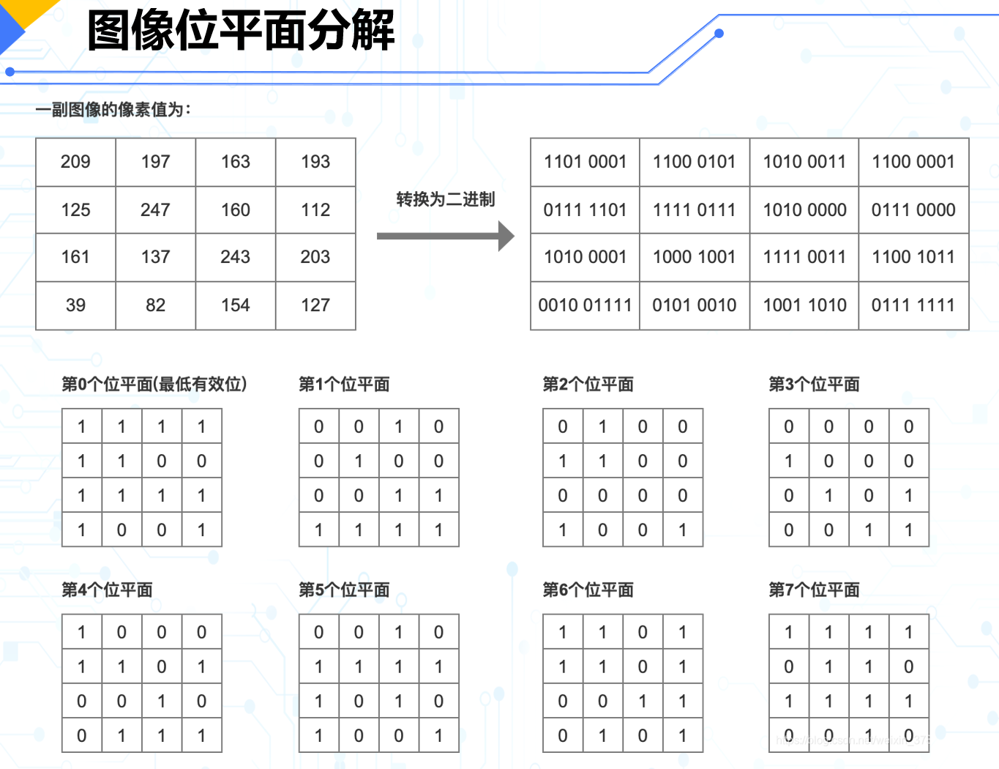

In [2]:
import cv2
import numpy as np
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
cv2.imshow("Original Image", img1)

# 获取图像的行和列
r,c=img1.shape

# 创建一个与原图相同大小的黑色图像
x = np.zeros((r,c), dtype=np.uint8)


# 按位与操作，提取第0位平面
# 提取因子
x[:,:] = 2**0
r0 = cv2.bitwise_and(img1,x)
r0[r0>0] = 255
cv2.imshow("r0", r0)

# 按位与操作，提取第7位平面
# 提取因子
x[:,:] = 2**7
r7 = cv2.bitwise_and(img1,x)
r7[r7>0] = 255
cv2.imshow("r7", r7)

cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

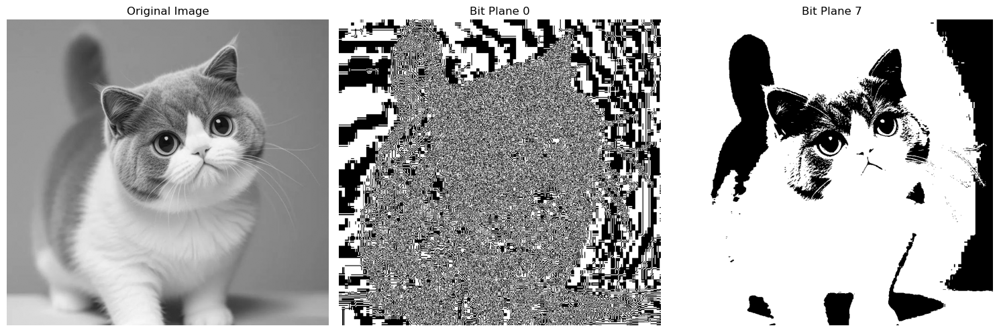

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def display_bit_planes():
    img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
    if img1 is None:
        print("无法读取图像文件")
        return
    
    # 使用matplotlib显示，避免OpenCV窗口问题
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # 原图
    axes[0].imshow(img1, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # 提取第0位平面
    r0 = cv2.bitwise_and(img1, 2**0)
    r0[r0 > 0] = 255
    axes[1].imshow(r0, cmap='gray')
    axes[1].set_title('Bit Plane 0')
    axes[1].axis('off')
    
    # 提取第7位平面
    r7 = cv2.bitwise_and(img1, 2**7)
    r7[r7 > 0] = 255
    axes[2].imshow(r7, cmap='gray')
    axes[2].set_title('Bit Plane 7')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

display_bit_planes()

## 图像的加解密
1. 加解密的概念
    - 对原始图像和密钥图像进行位异或实现加密
    - 对加密后的图像与密钥图像再进行位异或实现解密

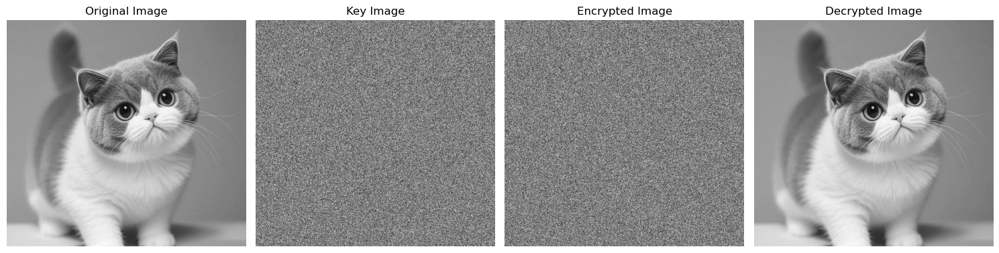

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# 创建一个图形窗口，包含4个子图
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_GRAYSCALE)
axes[0].imshow(img1, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# 获取图像的行和列
r,c=img1.shape
# 创建一个与原图相同大小的加密密钥
key = np.random.randint(0,256,(r,c), dtype=np.uint8)
axes[1].imshow(key, cmap='gray')
axes[1].set_title('Key Image')
axes[1].axis('off')

# 图像加密
encrypted = cv2.bitwise_xor(img1, key)
axes[2].imshow(encrypted, cmap='gray')
axes[2].set_title('Encrypted Image')
axes[2].axis('off')

# 图像解密
decrypted = cv2.bitwise_xor(encrypted, key)
axes[3].imshow(decrypted, cmap='gray')
axes[3].set_title('Decrypted Image')
axes[3].axis('off')

# 显示图像
plt.tight_layout()
plt.show()

## 图像的扩展
1. 概念：
    - 将图像的边界向四周扩展，扩展区域的填充内容由不同的方式决定，主要用于0填充和卷积操作
    - OpenCV通过copyMakeBorderO函数实现图像的扩展

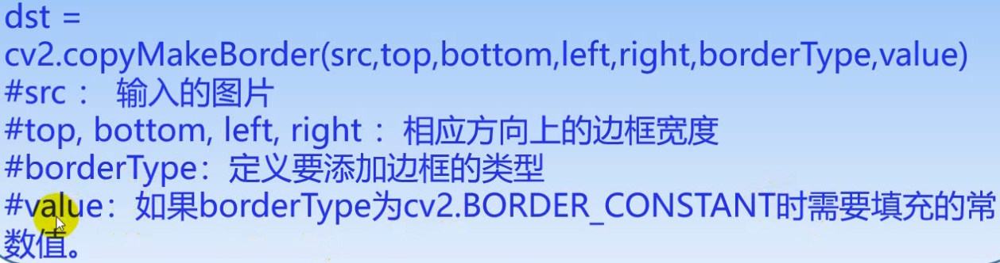

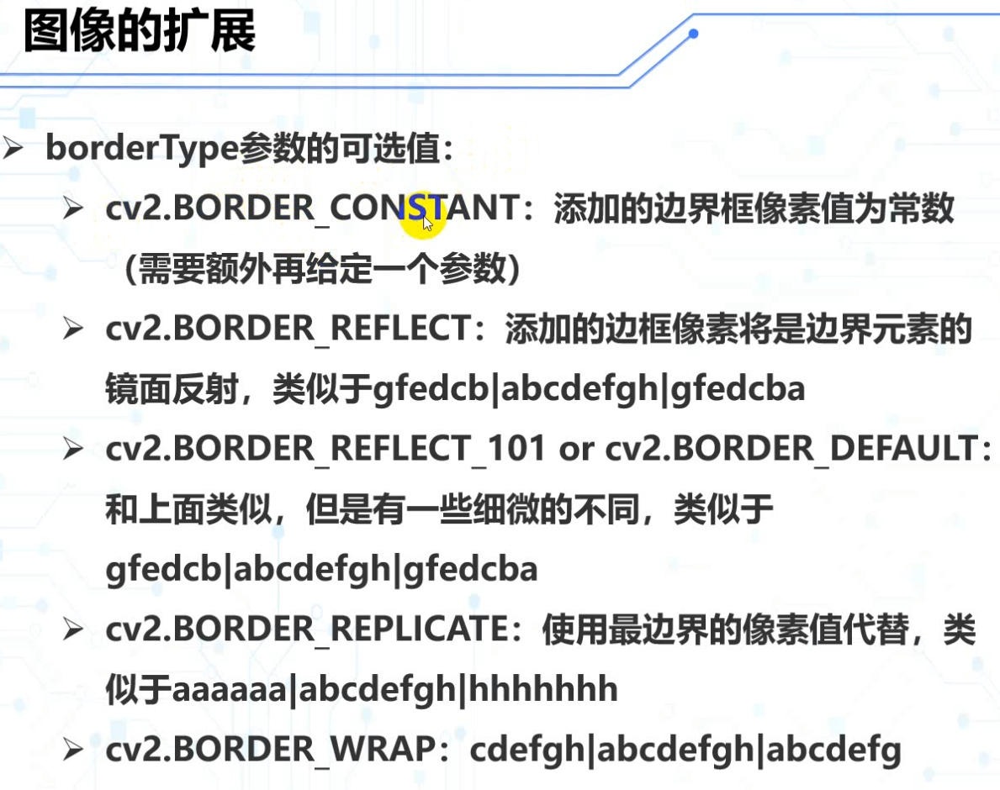

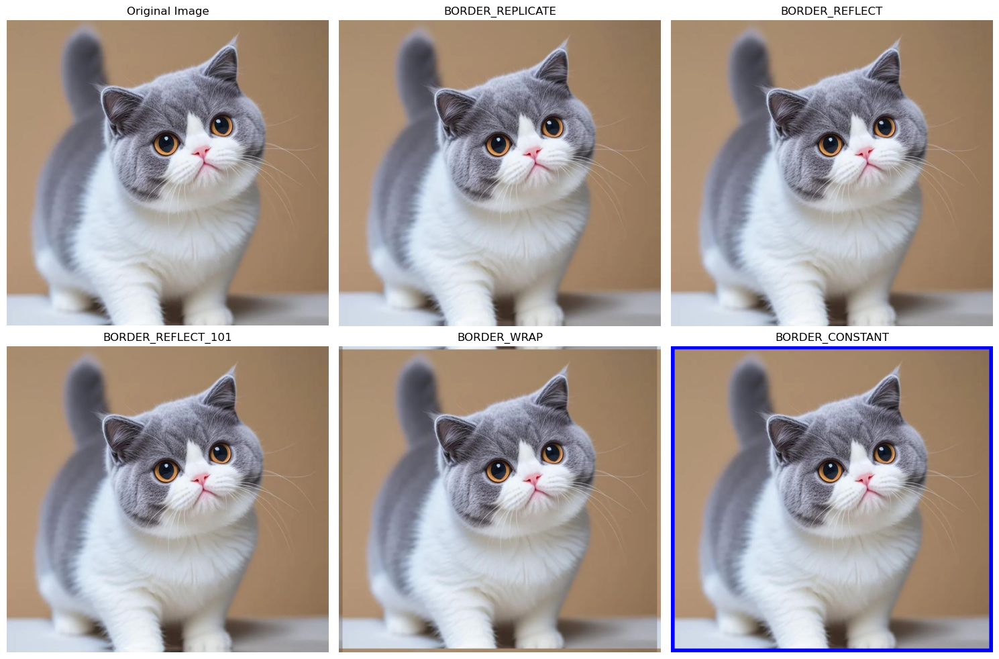

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
#
replicate = cv2.copyMakeBorder(img1, 10,10,10,10, borderType=cv2.BORDER_REPLICATE)
reflect = cv2.copyMakeBorder(img1, 10,10,10,10, borderType=cv2.BORDER_REFLECT)
reflect101 = cv2.copyMakeBorder(img1, 10,10,10,10, borderType=cv2.BORDER_REFLECT_101)
wrap = cv2.copyMakeBorder(img1, 10,10,10,10, borderType=cv2.BORDER_WRAP)
constant = cv2.copyMakeBorder(img1, 10,10,10,10, borderType=cv2.BORDER_CONSTANT, value=[255,0,0])
# 创建一个图形窗口，包含6个子图
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
# 显示原图
axes[0,0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axes[0,0].set_title('Original Image')
axes[0,0].axis('off')
# 显示不同边界扩展方式的图像
axes[0,1].imshow(cv2.cvtColor(replicate, cv2.COLOR_BGR2RGB))
axes[0,1].set_title('BORDER_REPLICATE')
axes[0,1].axis('off')
axes[0,2].imshow(cv2.cvtColor(reflect, cv2.COLOR_BGR2RGB))
axes[0,2].set_title('BORDER_REFLECT')
axes[0,2].axis('off')
axes[1,0].imshow(cv2.cvtColor(reflect101, cv2.COLOR_BGR2RGB))
axes[1,0].set_title('BORDER_REFLECT_101')
axes[1,0].axis('off')
axes[1,1].imshow(cv2.cvtColor(wrap, cv2.COLOR_BGR2RGB))
axes[1,1].set_title('BORDER_WRAP')
axes[1,1].axis('off')
axes[1,2].imshow(cv2.cvtColor(constant, cv2.COLOR_BGR2RGB))
axes[1,2].set_title('BORDER_CONSTANT')
axes[1,2].axis('off')
# 显示图像
plt.tight_layout()
plt.show()

## 色彩空间基础
1. 色彩空间：
    - "色彩空间”一词源于西方的"ColorSpace”，又称作“色域”。色彩学中，人们建立了多种色彩模型，以一维、二维、三维甚至四维空间坐标来表示某一色彩，这种坐标系统所能定义的色彩范围即色彩空间也称为颜色空间、颜色模型、彩色系统、彩色模型、和色彩模型等
2. GREY色彩空间：
    - 通常指8位灰度图，256个灰度级
3. RGB色彩空间：
    - 由红绿蓝三原色组合而成
4. HSV


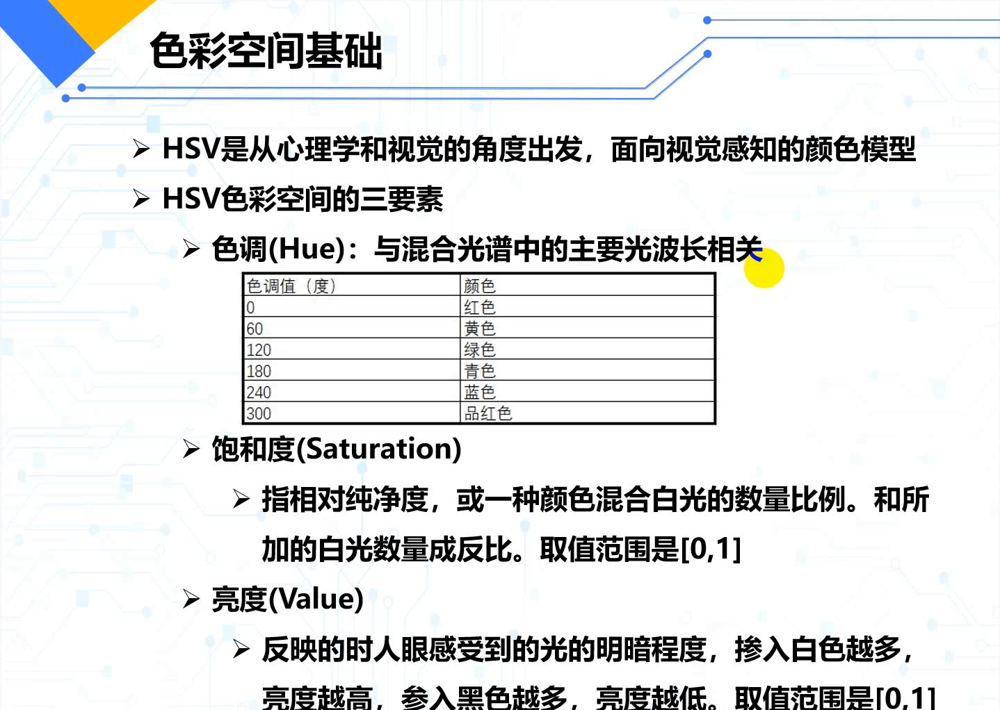

## 色彩空间的转换

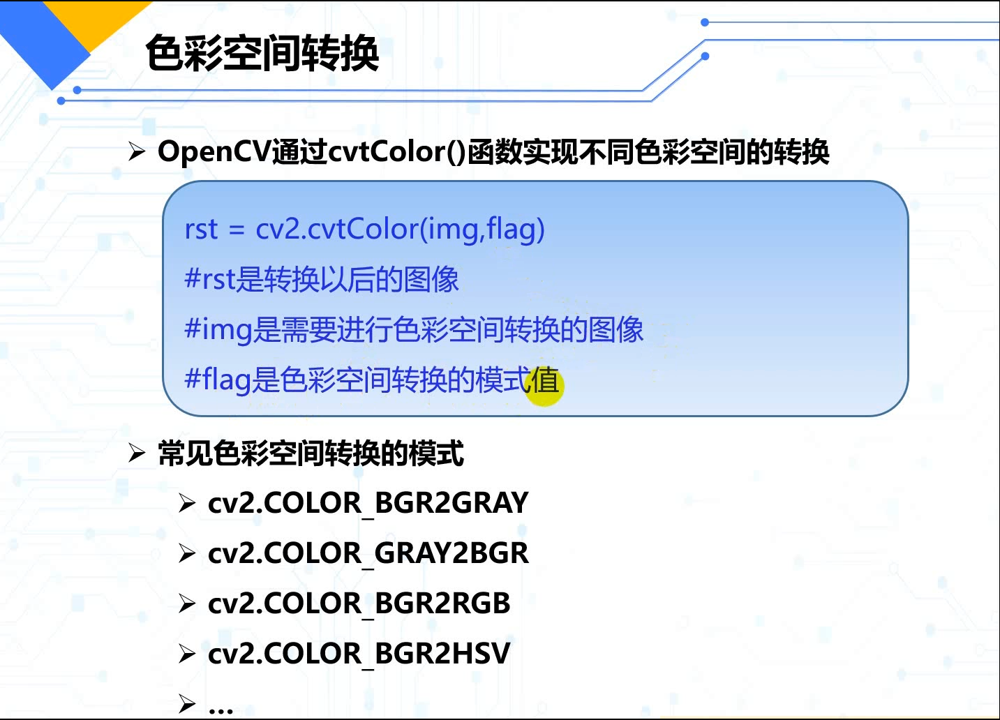

[[169  61  91 189]
 [ 68  80 123  85]]
(2, 4)


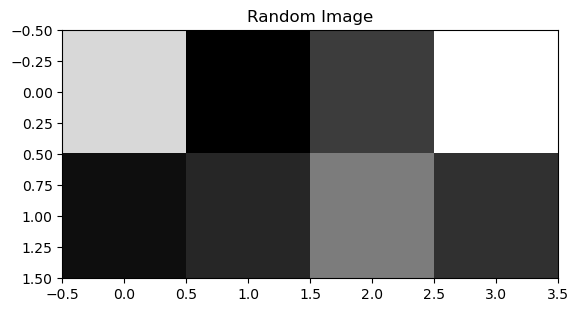

[[[169 169 169]
  [ 61  61  61]
  [ 91  91  91]
  [189 189 189]]

 [[ 68  68  68]
  [ 80  80  80]
  [123 123 123]
  [ 85  85  85]]]
(2, 4, 3)


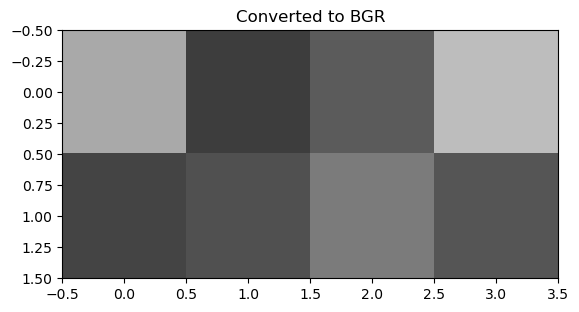

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = np.random.randint(0,256,(2,4), dtype=np.uint8)
print(img)
print(img.shape)
plt.imshow(img, cmap='gray')
plt.title('Random Image')
plt.show()

#
ret = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
print(ret)
print(ret.shape)
plt.imshow(ret)
plt.title('Converted to BGR')
plt.show()

In [3]:
import cv2
import numpy as np
lena = cv2.imread(r"OpenCV_dataset/2.jpg", cv2.IMREAD_COLOR)
rgb=cv2.cvtColor(lena,cv2.COLOR_BGR2RGB)
cv2.imshow('lena',lena)
cv2.imshow('rgb',rgb)
cv2.waitKey()
cv2.destroyAllWindows()

## HSV色彩空间应用

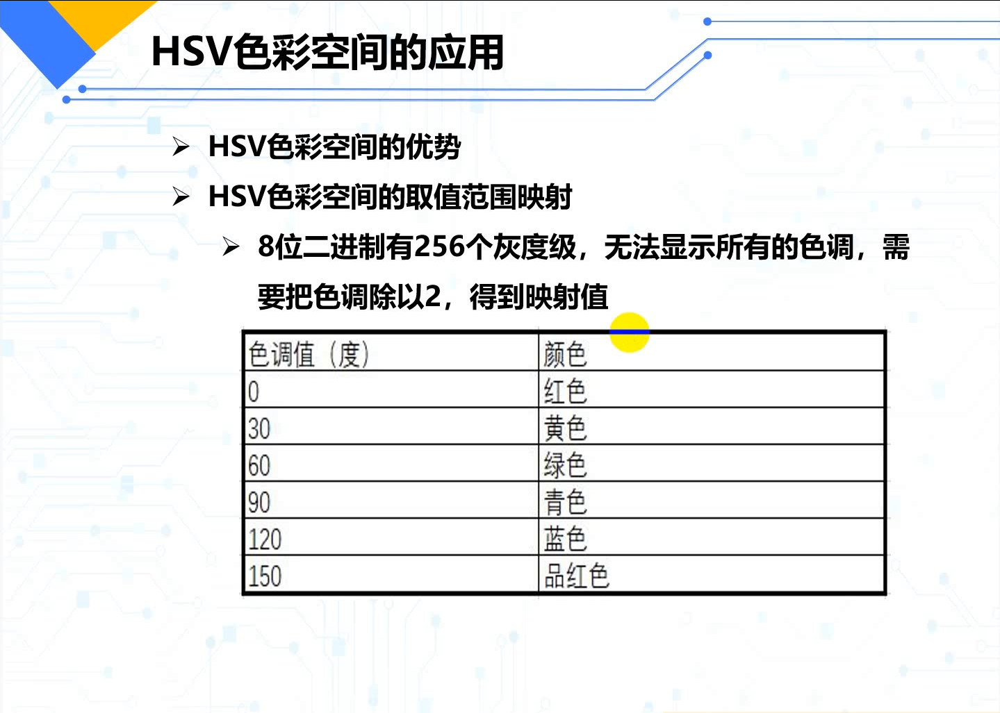

In [15]:
import cv2
import numpy as np
imgBlue= np.zeros((1,1,3),dtype=np.uint8)
imgBlue[0,0,2] = 255  # Blue channel
print(imgBlue)
BuleHsv = cv2.cvtColor(imgBlue,cv2.COLOR_BGR2HSV)
print(BuleHsv)

[[[  0   0 255]]]
[[[  0 255 255]]]


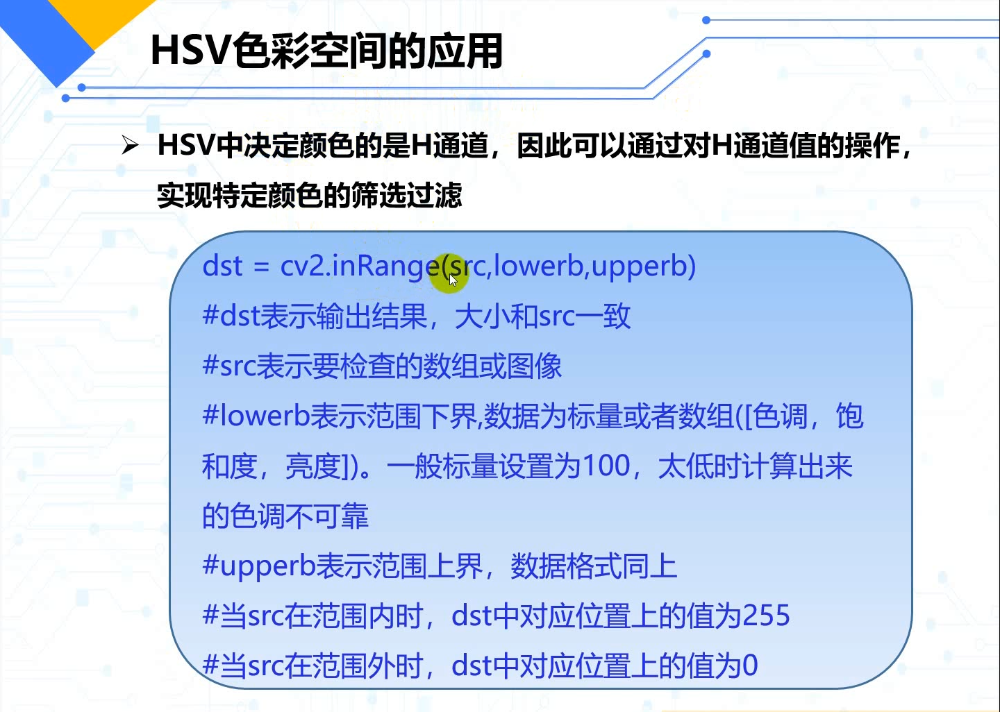

In [16]:
import cv2
import numpy as np
img = np.random.randint(0,256,(5,5), dtype=np.uint8)
min = 100
max = 200
result = cv2.inRange(img, min, max)
print("img=\n", img)
print("result=\n", result)

img=
 [[236 129 250  12 111]
 [ 50  52  11   4   7]
 [108  81 211 118 101]
 [136  27  63 131  88]
 [254  25  50 105 157]]
result=
 [[  0 255   0   0 255]
 [  0   0   0   0   0]
 [255   0   0 255 255]
 [255   0   0 255   0]
 [  0   0   0 255 255]]


In [20]:
import cv2
import numpy as np

img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

# Convert BGR to HSV
hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)

# 分离通道
h,s,v = cv2.split(hsv)

# 设置阈值
minHue = 5
maxHue = 170
hueMask = cv2.inRange(h, minHue, maxHue)

# 饱和度阈值
minSat = 50
maxSat = 166
satMask = cv2.inRange(s, minSat, maxSat)

# 组合掩码
mask = hueMask & satMask
# 提取感兴趣区域
ROI = cv2.bitwise_and(img1, img1, mask=mask)

cv2.imshow("ROI", ROI)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Alpha通道
1. 概念：
    - Alpha通道是RGBA色彩空间的第四个通道，表示透明度
    - 取值范围[0，1]或[0，255]，表示透明到不透明

In [25]:
import cv2
import numpy as np
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
bgra = cv2.cvtColor(img1, cv2.COLOR_BGR2BGRA)
b,g,r,a = cv2.split(bgra)
a[:,:] = 125
bgra125 = cv2.merge([b,g,r,a])
cv2.imwrite(r"OpenCV_dataset/1_bgra125.jpg", bgra125)

True

## 图像的几何变换
1. 概念：
    - 几何变换是将一幅图像映射到另外一幅图像内的操作
2. 常见几何变换类型
    - 缩放：改变图像的大小
    - 翻转：
    - 仿射
    - 透视

### 缩放
- 通过resize()函数实现
- resize()函数参数说明
    - dsize参数包含了两个部分，分别是缩放后的width（列数）和
    height(行数)，和shape的属性位置是相反的
    - dsize不存在时(None)，由fx和fy决定大小;存在时，fx和
    fy无效，指定了fx和fy时，dsize的计算结果是
    Size(round(src.cols*fx),round(src.rows*fy))
    - 插值是指进行几何处理时，给无法直接通过映射得到值的像素
    点赋值，插值方式决定了如何确定它们的值
    - 当缩小图像时，插值方式使用区域插值方式(INTERAREA），
    能得到最好的效果；当放大图像时，插值方式使用三次样条插
    值方式(INTERCUBIC，速度稍慢)或双线性插值方式
    (INTERLINEAR,速度稍快),效果最好

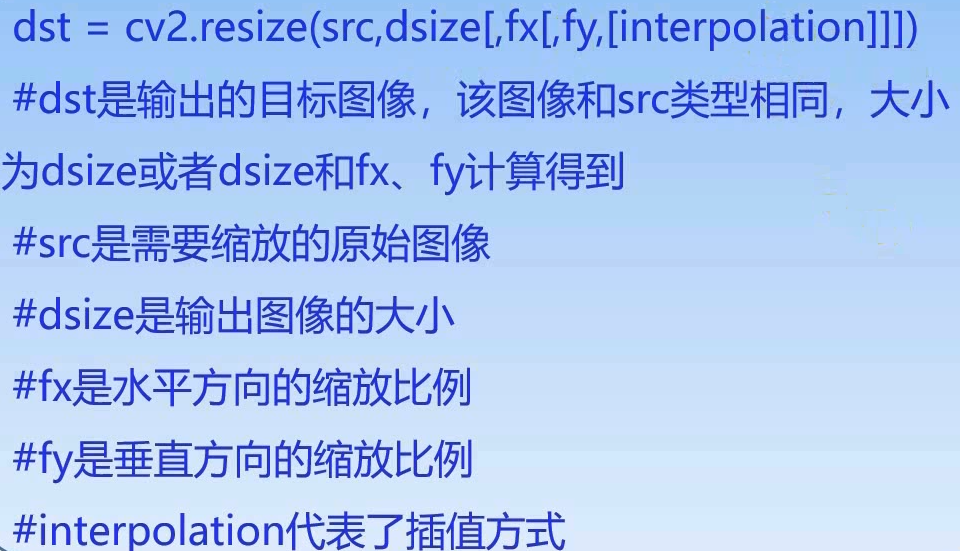

In [2]:
import cv2
import numpy as np
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
r,c = img1.shape[:2]
# 缩放
img2 = cv2.resize(img1, (c-100, r+100))
cv2.imshow("Original Image", img1)
cv2.imshow("Resized Image", img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

### 翻转
- 翻转是指将图像分别或同时按X轴、Y轴为基准进行翻转
- OpenCV通过flip()函数实现翻转功能

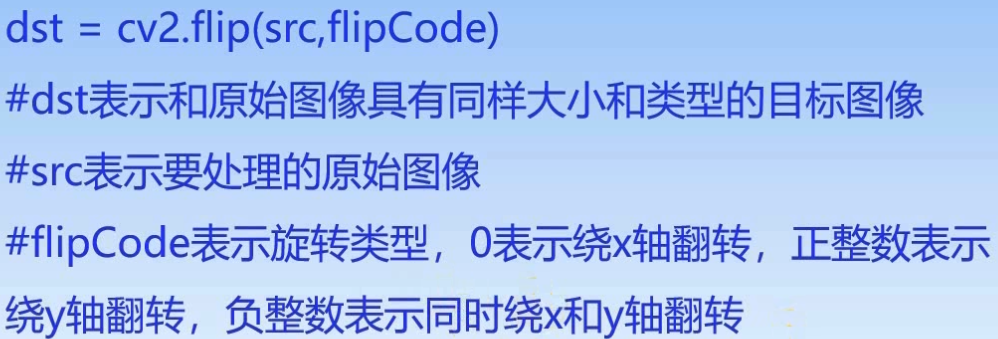

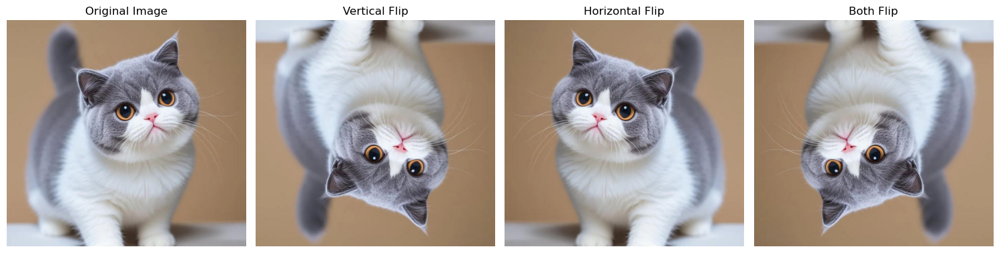

In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# 创建子图
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
# 翻转
imgx = cv2.flip(img1, 0)  # 垂直翻转
imgy = cv2.flip(img1, 1)  # 水平翻转
imgxy = cv2.flip(img1, -1) # 同时翻转
# 显示图像
axes[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(imgx, cv2.COLOR_BGR2RGB))
axes[1].set_title('Vertical Flip')
axes[1].axis('off')
axes[2].imshow(cv2.cvtColor(imgy, cv2.COLOR_BGR2RGB))
axes[2].set_title('Horizontal Flip')
axes[2].axis('off')
axes[3].imshow(cv2.cvtColor(imgxy, cv2.COLOR_BGR2RGB))
axes[3].set_title('Both Flip')
axes[3].axis('off')

plt.tight_layout()
plt.show()

### 仿射
- 仿射是指图像经过一系列变换实现平移和旋转的操作，并且保持
图像的平直性和平行性
- 仿射的原理是通过一个变换矩阵完成平移或旋转等变换
- OpenCV通过wrapAffine()函数实现仿射变换

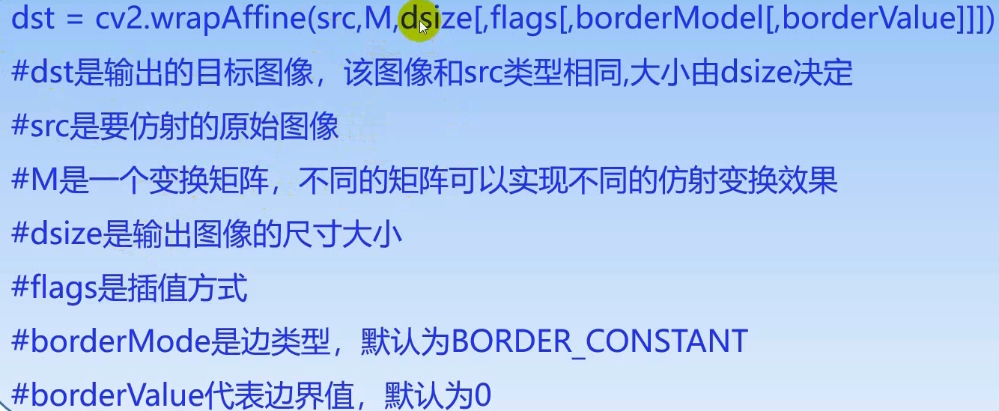

#### 平移变换矩阵的原理

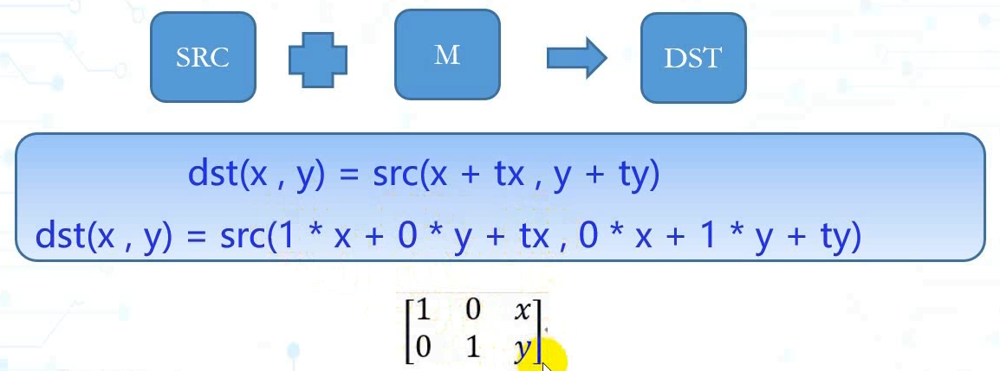

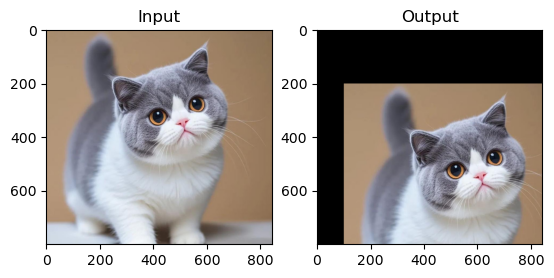

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

# 获取图像的行和列
r,c = img1.shape[:2]

# 平移变换矩阵
M = np.float32([[1,0,100],[0,1,200]])

# 仿射变换
img2 = cv2.warpAffine(img1, M, (c, r))

# 显示图像
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)), plt.title('Input')
plt.subplot(122), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)), plt.title('Output')
plt.show()

#### 旋转仿射
- 通过函数getRotationMatrix2D()构建旋转仿射需要的转换矩阵

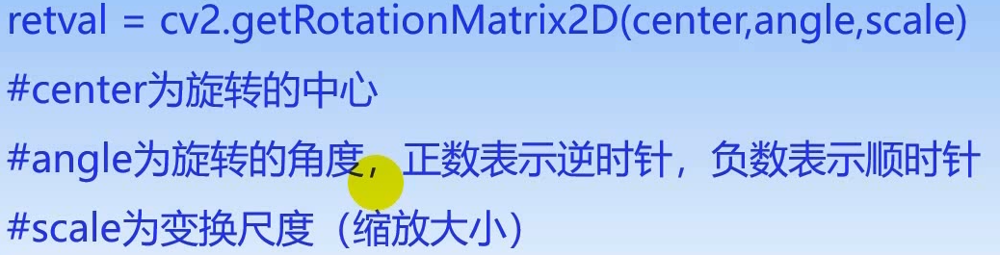

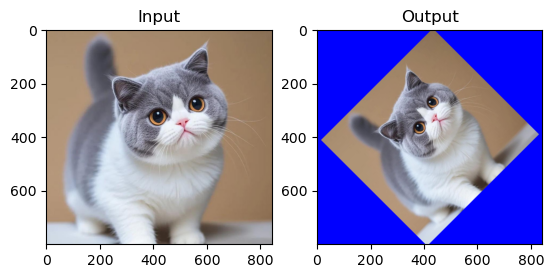

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

# 获取图像的行和列
r,c = img1.shape[:2]

# 旋转仿射变换矩阵
# 第一个参数：旋转中心
# 第二个参数：旋转角度，正值表示逆时针旋转
# 第三个参数：缩放因子
M = cv2.getRotationMatrix2D((c/2, r/2), 45, 0.7)

# 仿射变换
# 第一个参数：输入图像
# 第二个参数：变换矩阵
# 第三个参数：输出图像的大小，格式为（宽，高）
# 第四个参数：边界填充颜色，默认为黑色
rotation = cv2.warpAffine(img1, M, (c, r),borderValue=(255,0,0))

# 显示图像
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)), plt.title('Input')
plt.subplot(122), plt.imshow(cv2.cvtColor(rotation, cv2.COLOR_BGR2RGB)), plt.title('Output')
plt.show()


#### 扭曲仿射
- 通过函数getAffineTransform（)构建复杂仿射需要的转换矩阵

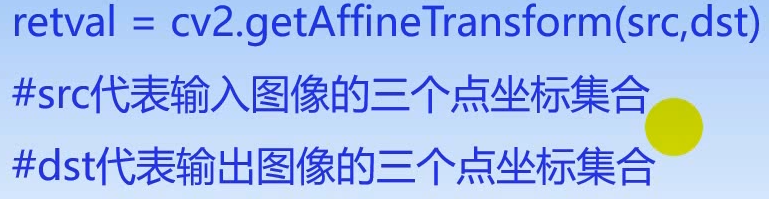

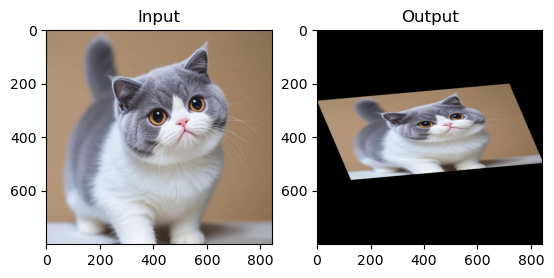

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)

# 获取图像的行和列
r,c = img1.shape[:2]

# 三点确定一个仿射变换
# p1为原图像的三个点，p2为目标图像的三个点
# 注意：点的顺序要对应
p1 = np.float32([[0,0],[c-1,0],[0,r-1]])
p2 = np.float32([[0,r*0.33],[c*0.85,r*0.25],[c*0.15,r*0.7]])
M = cv2.getAffineTransform(p1, p2)

# 仿射变换
dst = cv2.warpAffine(img1, M, (c, r))

# 显示图像
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)), plt.title('Input')
plt.subplot(122), plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)), plt.title('Output')
plt.show()

### 透视
- 透视可以将矩形图像变换成任意四边形，可以保持平直性，但会
失去平行性
- 透视不仅可以使物体看起来多维、饱满，还可以用来制造聚拢感、
距离

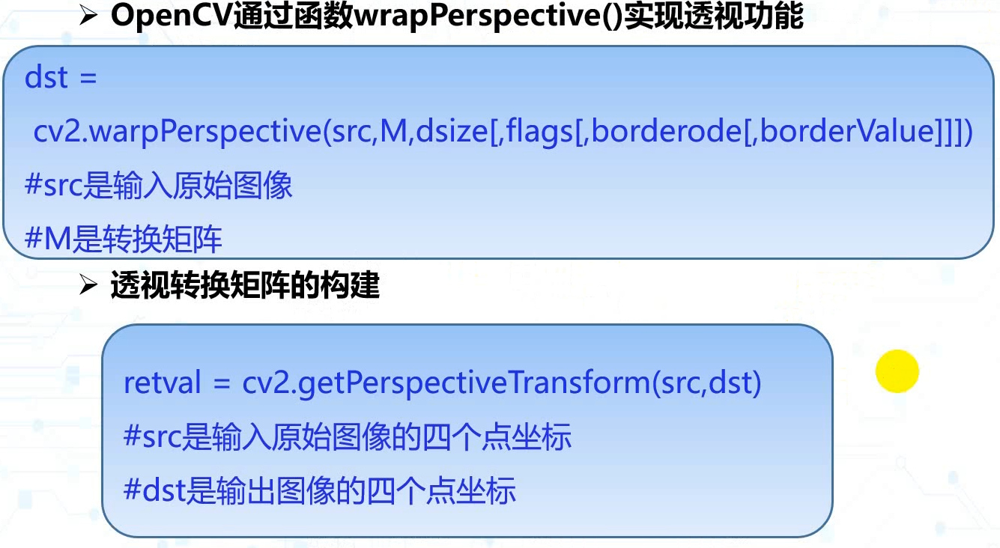

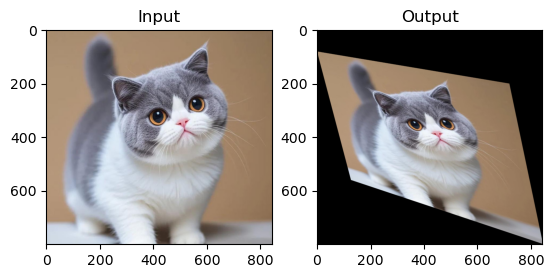

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# 读取图像
img1 = cv2.imread(r"OpenCV_dataset/1.jpg", cv2.IMREAD_COLOR)
# 获取图像的行和列
r,c = img1.shape[:2]
# 四点确定一个透视变换
# p1为原图像的四个点，p2为目标图像的四个点
# 注意：点的顺序要对应
p1 = np.float32([[0,0],[c-1,0],[0,r-1],[c-1,r-1]])
p2 = np.float32([[0,r*0.10],[c*0.85,r*0.25],[c*0.15,r*0.7],[c-1,r-1]])
M = cv2.getPerspectiveTransform(p1, p2)
# 透视变换
dst = cv2.warpPerspective(img1, M, (c, r))
# 显示图像
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)), plt.title('Input')
plt.subplot(122), plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)), plt.title('Output')
plt.show()

## 平滑处理
1. 概念：
    - 平滑处理是指在尽量保留图像原有信息的情况下，过滤掉图像内部的噪声的过程，也成为模糊或滤波
2. 平滑处理的原理：
    - 找到图像中与周围像素点的像素值差异较大的像素点，将目标像素点的像素值调整为周围像素点的近似值
3. 平滑处理的常见类型：
    - 均值滤波
    - 方框滤波
    - 高斯滤波
    - 中值滤波
    - 双边滤波
    自定义滤波(2D卷积)

### 均值滤波
1. 概念：
    - 均值滤波是使用当前像素点周围M*N个像素值的均值来代替当前像素值